In [1]:
import pandas as pd
import numpy as np
# 
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# 
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.impute import KNNImputer
from imblearn.over_sampling import SMOTE



In [2]:
# managed My PC 
PATH_TEST = r'E:\_Projects\_Under Construction Projects\Credit-score-classification\test.csv'
PATH_TRAIN=r'E:\_Projects\_Under Construction Projects\Credit-score-classification\train.csv'

In [3]:
df_train = pd.read_csv(PATH_TRAIN, encoding='utf-8', sep=',')
df_train_Raw = pd.read_csv(PATH_TRAIN, encoding='utf-8', sep=',')

C:\Users\hp\AppData\Local\Temp\ipykernel_3740\1449733162.py:1: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  df_train = pd.read_csv(PATH_TRAIN, encoding='utf-8', sep=',')
C:\Users\hp\AppData\Local\Temp\ipykernel_3740\1449733162.py:2: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  df_train_Raw = pd.read_csv(PATH_TRAIN, encoding='utf-8', sep=',')


In [4]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

In [5]:
df_train.describe(include='object').T

,count,unique,top,freq
ID,100000,100000,0x1602,1
Customer_ID,100000,12500,CUS_0xd40,8
Month,100000,8,January,12500
Name,90015,10139,Langep,44
Age,100000,1788,38,2833
SSN,100000,12501,#F%$D@*&8,5572
Occupation,100000,16,_______,7062
Annual_Income,100000,18940,36585.12,16
Num_of_Loan,100000,434,3,14386
Type_of_Loan,88592,6260,Not Specified,1408


<AxesSubplot: >

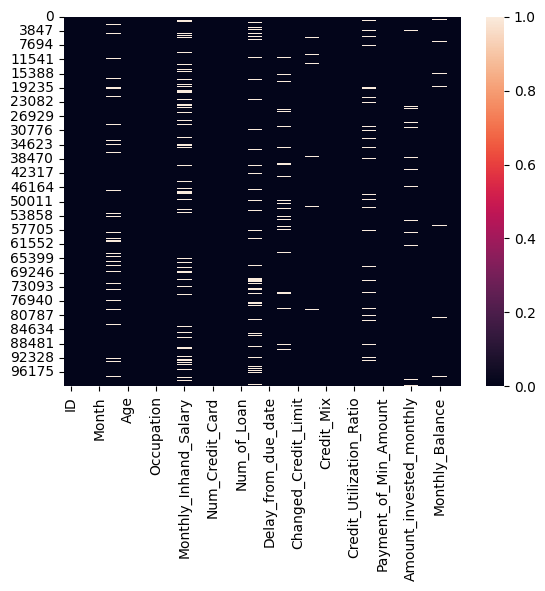

In [6]:
sns.heatmap(df_train.isnull())

# Handling Missing and Wrong Values

In [7]:
### MY FUNCTIONS ###

# remove _ from _8 | 8_ 
def Remove_value(datafram, col):
    datafram[col] = [str(s).replace('_', '') for s in datafram[col]]

# convert to dt
def ConvertDataType(datafram, col, dt):
    datafram[col] = datafram[col].astype(dt)


## [03] Name 
- missing :
    -  NaN Values

In [8]:
print(df_train['Name'].value_counts())

print('#'*15)

print('Missing = ',df_train['Name'].isnull().sum())


Name
Langep            44
Stevex            44
Vaughanl          39
Jessicad          39
Raymondr          38
                  ..
Alina Selyukhg     4
Habboushg          4
Mortimerq          4
Ronaldf            4
Timothyl           3
Name: count, Length: 10139, dtype: int64
###############
Missing =  9985


In [9]:
df_train[df_train['Name'].isnull()]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
7,0x1609,CUS_0xd40,August,NaN,23,#F%$D@*&8,Scientist,19114.12,1824.843333,3,...,Good,809.98,23.933795,NaN,No,49.574949,24.785216509052056,High_spent_Medium_value_payments,358.12416760938714,Standard
17,0x161b,CUS_0x2dbc,February,NaN,34,486-85-3974,Engineer,143162.64,12187.220000,1,...,Good,1303.01,41.702573,17 Years and 10 Months,No,246.992319,232.86038375993544,High_spent_Small_value_payments,998.8692967863226,Good
22,0x1620,CUS_0x2dbc,July,NaN,34,486-85-3974,Engineer,143162.64,12187.220000,1,...,Good,1303.01,38.068624,18 Years and 3 Months,No,246.992319,263.17416316163934,High_spent_Small_value_payments,968.5555173846187,Standard
64,0x1662,CUS_0x4157,January,NaN,23,070-19-1622,Doctor,114838.41,9843.867500,2,...,Good,1377.74,33.664554,21 Years and 4 Months,No,226.892792,215.19351594560425,High_spent_Small_value_payments,802.3004421328528,Good
80,0x167a,CUS_0xa66b,January,NaN,40,221-30-8554,Teacher,33751.27,2948.605833,5,...,Standard,1328.93,37.089076,19 Years and 2 Months,NM,65.008174,117.30669710658556,High_spent_Medium_value_payments,362.54571194023237,Standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99964,0x25fba,CUS_0x372c,May,NaN,18,340-85-7301,Lawyer,42903.79,3468.315833,0,...,Good,1079.48,23.140640,28 Years and 5 Months,No,34.975457,450.6460933992599,Low_spent_Small_value_payments,151.210033,Good
99965,0x25fbb,CUS_0x372c,June,NaN,19,340-85-7301,Lawyer,42903.79,3468.315833,0,...,Good,1079.48,35.549456,28 Years and 6 Months,No,34.975457,187.3559686116327,Low_spent_Large_value_payments,394.500158,Good
99969,0x25fc3,CUS_0xf16,February,NaN,45,868-70-2218,Media_Manager,16680.35,1528.029167,1,...,Good,897.16,34.085971,21 Years and 2 Months,No,41.113561,104.64623687765652,High_spent_Small_value_payments,267.043119,Good
99973,0x25fc7,CUS_0xf16,June,NaN,45,868-70-2218,Media_Manager,16680.35,1528.029167,1,...,Good,897.16,24.972853,21 Years and 6 Months,No,41.113561,__10000__,Low_spent_Small_value_payments,233.301539,Good


In [10]:
# get customer id for nan values in Name Column
Customer_IDs = df_train[df_train['Name'].isnull()]['Customer_ID'].values

# fill missing values
for id in Customer_IDs:
    # get real name by customer id
    realName = ''
    realName = df_train.loc[(df_train['Customer_ID'] == id) & (df_train['Name'].notna())]['Name'].values[0]
    # fill missing value
    df_train.loc[(df_train['Customer_ID'] == id) & (df_train['Name'].isna()), ['Name']] = realName


In [11]:
df_train[df_train['Name'].isnull()] # Check 

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score


## [04] Age
- Missing :
    - values Such as (_28)
    - values < 0
    - values > 60 


In [12]:
# We are have values = 28_
Remove_value(df_train, 'Age')

# Convert to int 
ConvertDataType(df_train, 'Age',int)

In [13]:
fig = px.box(df_train, y="Age")
fig.show()

In [14]:
Customer_IDs= df_train[(df_train['Age'] < 0) | (df_train['Age'] > 60)]['Customer_ID'].values

for id in Customer_IDs:
    realAge = df_train[df_train['Customer_ID'] ==id]['Age'].drop_duplicates().values[0]
    if realAge < 0 or realAge > 60:
        realAge = df_train[df_train['Customer_ID'] ==id]['Age'].drop_duplicates().values[1]

    df_train.loc[(df_train['Customer_ID'] == id) & (
        (df_train['Age'] < 0) | (df_train['Age'] > 60)), ['Age']] = realAge


In [15]:
fig = px.box(df_train, y="Age")
fig.show()

## [05] SSN
- missing:
    - values = #F%$D@*&8

In [16]:
df_train['SSN'].value_counts()

SSN
#F%$D@*&8      5572
078-73-5990       8
486-78-3816       8
750-67-7525       8
903-50-0305       8
               ... 
856-06-6147       4
753-72-2651       4
331-28-1921       4
604-62-6133       4
286-44-9634       4
Name: count, Length: 12501, dtype: int64

In [17]:
df_train[df_train['SSN']=='#F%$D@*&8']

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
7,0x1609,CUS_0xd40,August,Aaron Maashoh,23,#F%$D@*&8,Scientist,19114.12,1824.843333,3,...,Good,809.98,23.933795,NaN,No,49.574949,24.785216509052056,High_spent_Medium_value_payments,358.12416760938714,Standard
29,0x162b,CUS_0xb891,June,Jasond,55,#F%$D@*&8,_______,30689.89,2612.490833,2,...,_,632.46,27.445422,17 Years and 8 Months,No,16.415452,84.95284817115969,High_spent_Small_value_payments,419.8807835023488,Standard
51,0x164d,CUS_0x284a,April,Nadiaq,34,#F%$D@*&8,Lawyer,131313.4,10469.207759,0,...,Good,352.16,42.645785,30 Years and 10 Months,No,23834.000000,337.43495631738324,High_spent_Medium_value_payments,899.1987716145285,Good
54,0x1650,CUS_0x284a,July,Nadiaq,34,#F%$D@*&8,Lawyer,10909427.0,NaN,0,...,Good,352.16,26.947565,31 Years and 1 Months,No,911.220179,930.3918977796665,!@9#%8,326.24183015224526,Good
98,0x1694,CUS_0x3e45,March,Harriet McLeodd,35,#F%$D@*&8,Entrepreneur,54392.16_,NaN,6,...,_,179.22,31.258928,27 Years and 0 Months,NM,124.392082,33.349568589344514,High_spent_Large_value_payments,558.9263489897351,Standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99914,0x25f70,CUS_0x1619,March,Phil Wahbao,54,#F%$D@*&8,Media_Manager,20059.98,1523.665000,8,...,Good,909.01,29.204711,16 Years and 5 Months,No,45.076827,111.56713873012444,Low_spent_Large_value_payments,265.722534,Poor
99942,0x25f98,CUS_0xad4f,July,Sabina Zawadzkig,48,#F%$D@*&8,Developer,22620.79,1722.065833,6,...,Standard,642.46,24.714779,29 Years and 9 Months,No,0.000000,16.53218878920387,High_spent_Large_value_payments,395.674395,Poor
99946,0x25fa0,CUS_0x51b3,March,Ryana,33,#F%$D@*&8,Media_Manager,59146.36,4908.863333,2,...,Good,418.03,35.750925,20 Years and 3 Months,No,26.778419,188.54469705568923,High_spent_Medium_value_payments,525.563217,Standard
99968,0x25fc2,CUS_0xf16,January,Maria Sheahanb,44,#F%$D@*&8,Media_Manager,16680.35,1528.029167,1,...,Good,897.16,39.868572,NaN,NM,41.113561,52.95197781627658,High_spent_Small_value_payments,318.737378,Good


In [18]:
df_train[df_train['Customer_ID'] == 'CUS_0x51b3']['SSN']

99944    837-85-9800
99945    837-85-9800
99946      #F%$D@*&8
99947    837-85-9800
99948    837-85-9800
99949    837-85-9800
99950    837-85-9800
99951    837-85-9800
Name: SSN, dtype: object

In [19]:
Customer_IDs = df_train[df_train['SSN']== '#F%$D@*&8']['Customer_ID'].values
Customer_IDs

for id in Customer_IDs:
    realSSN = df_train[df_train['Customer_ID'] ==id]['SSN'].drop_duplicates().values[0]
    if realSSN == '#F%$D@*&8':
        realSSN = df_train[df_train['Customer_ID'] ==id]['SSN'].drop_duplicates().values[1]

    df_train.loc[(df_train['Customer_ID'] == id) & (
        df_train['SSN'] == '#F%$D@*&8'), ['SSN']] = realSSN


In [20]:
df_train[df_train['SSN'] == '#F%$D@*&8'] # Check 

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score


## [06] Occupation
- Missing :
    - values = _______

In [21]:
print(df_train['Occupation'].value_counts())
print('#'*15)
print('Missing = ',df_train['Occupation'].isnull().sum())

Occupation
_______          7062
Lawyer           6575
Architect        6355
Engineer         6350
Scientist        6299
Mechanic         6291
Accountant       6271
Developer        6235
Media_Manager    6232
Teacher          6215
Entrepreneur     6174
Doctor           6087
Journalist       6085
Manager          5973
Musician         5911
Writer           5885
Name: count, dtype: int64
###############
Missing =  0


In [22]:
df_train[df_train['Occupation'] == '_______']

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
8,0x160e,CUS_0x21b1,January,Rick Rothackerj,28,004-07-5839,_______,34847.84,3037.986667,2,...,Good,605.03,24.464031,26 Years and 7 Months,No,18.816215,104.291825168246,Low_spent_Small_value_payments,470.69062692529184,Standard
16,0x161a,CUS_0x2dbc,January,Langep,34,486-85-3974,_______,143162.64,12187.220000,1,...,Good,1303.01,28.616735,17 Years and 9 Months,No,246.992319,168.413702679309,!@9#%8,1043.3159778669492,Good
18,0x161c,CUS_0x2dbc,March,Langep,34,486-85-3974,_______,143162.64,NaN,1,...,Good,1303.01,26.519815,17 Years and 11 Months,No,246.992319,__10000__,High_spent_Small_value_payments,715.741367403555,Good
20,0x161e,CUS_0x2dbc,May,Langep,34,486-85-3974,_______,143162.64,12187.220000,1,...,Good,1303.01,31.376150,18 Years and 1 Months,No,246.992319,430.9475278803298,Low_spent_Large_value_payments,810.7821526659284,Good
29,0x162b,CUS_0xb891,June,Jasond,55,072-31-6145,_______,30689.89,2612.490833,2,...,_,632.46,27.445422,17 Years and 8 Months,No,16.415452,84.95284817115969,High_spent_Small_value_payments,419.8807835023488,Standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99920,0x25f7a,CUS_0x2654,January,enj,37,647-67-8889,_______,139664.96,11777.746667,3,...,_,365.66,31.043048,29 Years and 7 Months,Yes,423.731016,282.78234595777644,High_spent_Large_value_payments,711.261305,Standard
99935,0x25f8d,CUS_0xb11c,August,Yinka Adegokej,38,546-94-4789,_______,15319.65,1460.637500,6,...,Bad,1453.61,34.557510,11 Years and 4 Months,Yes,28.182033,191.87777851803025,Low_spent_Small_value_payments,216.003938,Poor
99937,0x25f93,CUS_0xad4f,February,Sabina Zawadzkig,47,226-45-0652,_______,22620.79,1722.065833,7,...,Standard,642.46,31.841872,NaN,No,0.000000,105.07629339039072,Low_spent_Large_value_payments,337.13029,Standard
99943,0x25f99,CUS_0xad4f,August,Sabina Zawadzkig,48,226-45-0652,_______,22620.79,NaN,6,...,_,642.46,34.026427,29 Years and 10 Months,No,0.000000,205.21728040016708,Low_spent_Small_value_payments,256.989303,Poor


In [23]:
Customer_IDs = df_train[df_train['Occupation']== '_______']['Customer_ID'].values
Customer_IDs

for id in Customer_IDs:
    realOcc = df_train[df_train['Customer_ID'] ==id]['Occupation'].drop_duplicates().values[0]
    if realOcc == '_______':
        realOcc = df_train[df_train['Customer_ID'] == id]['Occupation'].drop_duplicates().values[1]

    df_train.loc[(df_train['Customer_ID'] == id) & (
        df_train['Occupation'] == '_______'), ['Occupation']] = realOcc


In [24]:
df_train[df_train['Occupation'] == '_______']

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score


## [07] Annual Income
- missing :
    - values  such as 280.60_
    - wrong values 
- outliers 

In [25]:
print(df_train['Annual_Income'].value_counts())
print('#'*15)
print('Missing = ',df_train['Annual_Income'].isnull().sum())

Annual_Income
36585.12     16
20867.67     16
17273.83     16
9141.63      15
33029.66     15
             ..
20269.93_     1
15157.25_     1
44955.64_     1
76650.12_     1
4262933.0     1
Name: count, Length: 18940, dtype: int64
###############
Missing =  0


In [26]:
# We are have values = 280.60_
Remove_value(df_train, 'Annual_Income')

# convert to float
ConvertDataType(df_train, 'Annual_Income', float)


In [27]:
fig = px.box(df_train, y="Annual_Income")
fig.show()

In [28]:
df_train[df_train['Annual_Income'] > 153000]


,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
54,0x1650,CUS_0x284a,July,Nadiaq,34,411-51-0676,Lawyer,10909427.0,NaN,0,...,Good,352.16,26.947565,31 Years and 1 Months,No,911.220179,930.3918977796665,!@9#%8,326.24183015224526,Good
231,0x1759,CUS_0xbffe,August,Dhanya Skariachano,40,311-13-7309,Architect,6515990.0,2210.032500,6,...,Standard,400.07,23.177617,30 Years and 10 Months,Yes,69.602920,51.83085897154975,High_spent_Large_value_payments,339.5694705464602,Standard
245,0x176f,CUS_0x9a71,June,Mukhopadhyayc,55,889-07-2357,Scientist,586359.0,1684.168333,1,...,Good,413.32,28.836349,18 Years and 8 Months,No,29.534584,68.95672493704708,High_spent_Medium_value_payments,319.9255246757902,Good
361,0x181f,CUS_0x8e9b,February,Rachelle Younglaic,15,925-51-5335,Entrepreneur,18334118.0,4369.482500,10,...,Bad,3422.49,36.729939,10 Years and 6 Months,Yes,314.901785,124.54147043620928,High_spent_Small_value_payments,257.50499429610903,Standard
368,0x182a,CUS_0x609d,January,Shupingu,27,911-47-6879,Architect,19717385.0,1057.435833,7,...,Bad,2797.17_,25.314339,13 Years and 11 Months,Yes,58.868441,60.55078556335062,High_spent_Small_value_payments,246.32435693137433,Standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99664,0x25dfa,CUS_0xb09,January,Lianau,31,228-47-4867,Lawyer,5794377.0,NaN,5,...,Good,928.28,38.616320,NaN,No,72.250125,169.35659164159352,High_spent_Large_value_payments,1210.84895,Standard
99714,0x25e44,CUS_0xadbd,March,Scotts,26,864-24-3672,Doctor,11712577.0,NaN,5,...,_,82.15,30.711678,23 Years and 1 Months,No,113.833391,121.49249986037856,Low_spent_Small_value_payments,334.657193,Standard
99721,0x25e4f,CUS_0x11c7,February,raden Reddallh,53,646-19-1493,Architect,8544730.0,3198.161667,5,...,Good,1019.46,26.702382,16 Years and 8 Months,No,86.809918,117.83868153104905,High_spent_Medium_value_payments,365.167567,Standard
99882,0x25f40,CUS_0x47fa,March,Yantoultra Nguif,31,291-51-7240,Mechanic,16884797.0,5440.945000,7,...,Standard,330.6,38.524095,23 Years and 0 Months,Yes,0.000000,__10000__,High_spent_Small_value_payments,536.34292,Standard


In [29]:
df_train[df_train['Customer_ID'] == 'CUS_0x284a']['Annual_Income']

48      131313.4
49      131313.4
50      131313.4
51      131313.4
52      131313.4
53      131313.4
54    10909427.0
55      131313.4
Name: Annual_Income, dtype: float64

In [30]:
Customer_IDs = df_train[df_train['Annual_Income']> 153000]['Customer_ID'].values


for id in Customer_IDs:
    realIncome = df_train[df_train['Customer_ID'] ==id]['Annual_Income'].drop_duplicates().min()
    # if realIncome > 153000 :
    #     realIncome = df_train[df_train['Customer_ID'] == id]['Annual_Income'].drop_duplicates().values[-1]

    df_train.loc[(df_train['Customer_ID'] == id) & (
        df_train['Annual_Income'] > 153000), ['Annual_Income']] = realIncome


In [31]:
fig = px.box(df_train, y="Annual_Income")
fig.show()

In [32]:
df_train[df_train['Customer_ID']=='CUS_0x2c31']['Annual_Income']

1728    173196.32
1729    173196.32
1730    173196.32
1731    173196.32
1732    173196.32
1733    173196.32
1734    173196.32
1735    173196.32
Name: Annual_Income, dtype: float64

## [08] Monthly Inhand Salary

In [33]:
print(df_train['Monthly_Inhand_Salary'].value_counts())
print("#"*20)
print('Missing = ',df_train['Monthly_Inhand_Salary'].isnull().sum())

Monthly_Inhand_Salary
6769.130000    15
6358.956667    15
2295.058333    15
6082.187500    15
3080.555000    14
               ..
1087.546445     1
3189.212103     1
5640.117744     1
7727.560450     1
2443.654131     1
Name: count, Length: 13235, dtype: int64
####################
Missing =  15002


In [34]:
# Convert nan to 0.0
df_train['Monthly_Inhand_Salary'].replace(np.nan, 0.0, inplace=True)
df_train[df_train['Monthly_Inhand_Salary']==0.0]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,0.0,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,0.0,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,0.0,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
5,0x1607,CUS_0xd40,June,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,0.0,3,...,Good,809.98,27.262259,22 Years and 6 Months,No,49.574949,62.430172331195294,!@9#%8,340.4792117872438,Good
11,0x1611,CUS_0x21b1,April,Rick Rothackerj,28,004-07-5839,Teacher,34847.84,0.0,2,...,Good,605.03,39.182656,26 Years and 10 Months,No,18.816215,99.30622796053305,Low_spent_Medium_value_payments,465.6762241330048,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99944,0x25f9e,CUS_0x51b3,January,Ryana,33,837-85-9800,Media_Manager,59146.36,0.0,2,...,_,418.03,34.720661,NaN,No,26.778419,606.4365424304076,Low_spent_Small_value_payments,147.671372,Standard
99955,0x25fad,CUS_0x2084,April,Ryanl,21,253-72-7758,Architect,38321.39,0.0,4,...,Good,678.57,35.455305,17 Years and 2 Months,No,362.072453,293.71319332766717,Low_spent_Large_value_payments,197.460577,Standard
99963,0x25fb9,CUS_0x372c,April,Lucia Mutikanik,18,340-85-7301,Lawyer,42903.79,0.0,0,...,Good,1079.48,30.625298,NaN,No,34.975457,31.19391926667726,High_spent_Large_value_payments,520.662207,Standard
99975,0x25fc9,CUS_0xf16,August,Maria Sheahanb,45,868-70-2218,Media_Manager,16680.35,0.0,1,...,Good,897.16,41.212367,NaN,No,41.113561,70.8055497847255,Low_spent_Large_value_payments,310.883806,Good


In [35]:
Customer_IDs = df_train[df_train['Monthly_Inhand_Salary']==0.0]['Customer_ID'].values

for id in Customer_IDs :
      realMis=df_train[df_train['Customer_ID'] ==
                  id]['Monthly_Inhand_Salary'].drop_duplicates().sort_values().values[-1]


      df_train.loc[(df_train['Customer_ID'] == id) & (df_train['Monthly_Inhand_Salary']==0.0)
                  , ['Monthly_Inhand_Salary']] = realMis


In [36]:
df_train[df_train['Monthly_Inhand_Salary'] == 0.0]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score


## [09] Num Bank Accounts

In [37]:
print(df_train['Num_Bank_Accounts'].value_counts())
print("#"*20)
print('Missing = ',df_train['Num_Bank_Accounts'].isnull().sum())

Num_Bank_Accounts
6       13001
7       12823
8       12765
4       12186
5       12118
        ...  
1626        1
1470        1
887         1
211         1
697         1
Name: count, Length: 943, dtype: int64
####################
Missing =  0


In [38]:
px.box(df_train,y='Num_Bank_Accounts')

In [39]:
df_train[(df_train['Num_Bank_Accounts'] > 11) |
        (df_train['Num_Bank_Accounts'] < 0)]


,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
267,0x1791,CUS_0x4004,April,Carlosj,44,679-26-6464,Writer,58317.00,4664.750000,1414,...,Standard,98.97,29.766107,NaN,Yes,149.897199,158.64827595455043,High_spent_Medium_value_payments,407.9295246244412,Standard
288,0x17b2,CUS_0x4080,January,ra Alperx,16,995-37-8920,Mechanic,29469.98,2227.831667,1231,...,_,3421.66,24.639658,NaN,Yes,69.685459,59.825596124675045,!@9#%8,363.27211196971183,Standard
310,0x17d0,CUS_0x42ac,July,Lawrencea,37,700-60-3660,Musician,15566.02,1423.168333,67,...,Standard,1693.95,29.706454,8 Years and 4 Months,Yes,43.070520,80.48442010154183,!@9#%8,308.76189362947565,Poor
339,0x17fd,CUS_0x9bc1,April,Jaisinghanij,42,445-18-4420,Architect,20574.47,1740.539167,572,...,Standard,749.95,36.559538,11 Years and 2 Months,Yes,49.348666,25.161404432750263,High_spent_Medium_value_payments,349.54384591241774,Standard
356,0x1816,CUS_0xaedb,May,Olivia Oranr,19,272-47-1135,Musician,85554.03,7185.502500,1488,...,_,1095.73,41.661802,19 Years and 11 Months,No,0.000000,70.82263261910934,High_spent_Large_value_payments,887.7276173808908,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99591,0x25d89,CUS_0x544,August,Jon Herskovitzu,29,163-45-1172,Mechanic,17013.29,1326.774167,813,...,_,1452.79,28.051684,32 Years and 6 Months,NM,13.109663,55.72695329443804,Low_spent_Small_value_payments,353.840801,Good
99638,0x25dd0,CUS_0x296f,July,David Millikenh,25,972-13-0672,Developer,125271.96,10374.330000,1481,...,Good,827.56,33.201730,25 Years and 8 Months,NM,241.065885,180.56001463373025,!@9#%8,855.8071,Poor
99666,0x25dfc,CUS_0xb09,March,Lianau,31,228-47-4867,Lawyer,146310.68,12124.556667,474,...,Good,928.28,43.274889,22 Years and 3 Months,No,72.250125,121.28482498252883,High_spent_Large_value_payments,1258.920717,Standard
99722,0x25e50,CUS_0x11c7,March,raden Reddallh,53,646-19-1493,Architect,36817.94,3198.161667,697,...,Good,1019.46,26.578799,16 Years and 9 Months,No,86.809918,123.91555910514948,Low_spent_Small_value_payments,399.09069,Standard


In [40]:
df_train[df_train['Customer_ID'] == 'CUS_0x1619']['Num_Bank_Accounts']


99912      8
99913      8
99914      8
99915      8
99916    182
99917      8
99918      8
99919      8
Name: Num_Bank_Accounts, dtype: int64

In [41]:
Customer_IDs=df_train[(df_train['Num_Bank_Accounts'] > 11) |(df_train['Num_Bank_Accounts'] < 0)]['Customer_ID'].values

for id in Customer_IDs:
    realNum = df_train[df_train['Customer_ID'] ==id]['Num_Bank_Accounts'].drop_duplicates().values[0]
    if realNum < 0 or realNum > 11:
        realNum = df_train[df_train['Customer_ID'] ==id]['Num_Bank_Accounts'].drop_duplicates().values[1]

    df_train.loc[(df_train['Customer_ID'] == id) & (
        (df_train['Num_Bank_Accounts'] < 0) | (df_train['Num_Bank_Accounts'] > 11)), ['Num_Bank_Accounts']] = realNum


In [42]:
px.box(df_train, y='Num_Bank_Accounts')


## [12] Num of Loan

In [43]:
print(df_train['Num_of_Loan'].value_counts())
print("#"*20)
print('Missing = ',df_train['Num_of_Loan'].isnull().sum())

Num_of_Loan
3        14386
2        14250
4        14016
0        10380
1        10083
         ...  
1320_        1
103          1
1444         1
392          1
966          1
Name: count, Length: 434, dtype: int64
####################
Missing =  0


In [44]:
# We are have values = 23058_
Remove_value(df_train, 'Num_of_Loan')
# convert to int
ConvertDataType(df_train, 'Num_of_Loan',int)

In [45]:
px.box(df_train,y='Num_of_Loan')

In [46]:
df_train[(df_train['Num_of_Loan'] > 9) |(df_train['Num_of_Loan'] < 0)].T


,21,31,34,39,53,61,64,78,126,180,...,99845,99853,99859,99876,99877,99901,99902,99919,99969,99987
ID,0x161f,0x162d,0x1634,0x1639,0x164f,0x165b,0x1662,0x1674,0x16bc,0x170e,...,0x25f07,0x25f13,0x25f1d,0x25f36,0x25f37,0x25f5b,0x25f5c,0x25f75,0x25fc3,0x25fdd
Customer_ID,CUS_0x2dbc,CUS_0xb891,CUS_0x1cdb,CUS_0x1cdb,CUS_0x284a,CUS_0x5407,CUS_0x4157,CUS_0xba08,CUS_0x33d2,CUS_0xac86,...,CUS_0x944e,CUS_0x3048,CUS_0x1285,CUS_0x3855,CUS_0x3855,CUS_0x4986,CUS_0x4986,CUS_0x1619,CUS_0xf16,CUS_0x8600
Month,June,August,March,August,June,June,January,July,July,May,...,June,June,April,May,June,June,July,August,February,April
Name,Langep,Jasond,Deepaa,Deepaa,Nadiaq,Annk,Charlie Zhur,Jamesj,Chalmersa,Nickb,...,Vlastelicax,Rick Rothackeru,Lauriay,Xolai,Xolai,Charles Abbotta,Charles Abbotta,Phil Wahbao,Maria Sheahanb,Sarah McBridec
Age,34,55,21,21,34,30,23,45,31,20,...,23,40,43,27,27,34,34,54,45,28
SSN,486-85-3974,072-31-6145,615-06-7821,615-06-7821,411-51-0676,500-92-6408,070-19-1622,366-68-1681,965-46-2491,028-16-4402,...,815-15-2261,375-64-6913,540-18-1115,963-55-7106,963-55-7106,971-61-8388,971-61-8388,683-59-7399,868-70-2218,031-35-0942
Occupation,Engineer,Entrepreneur,Developer,Developer,Lawyer,Media_Manager,Doctor,Journalist,Scientist,Entrepreneur,...,Architect,Scientist,Architect,Scientist,Scientist,Entrepreneur,Entrepreneur,Media_Manager,Media_Manager,Architect
Annual_Income,143162.64,30689.89,35547.71,35547.71,131313.4,34081.38,114838.41,31370.8,31993.78,106733.13,...,11834.645,81093.16,10692.16,118677.54,118677.54,41329.56,41329.56,20059.98,16680.35,20002.88
Monthly_Inhand_Salary,12187.22,2612.490833,2853.309167,2853.309167,11242.783333,2611.115,9843.8675,2825.233333,2942.148333,8873.4275,...,688.220417,7017.763333,817.013333,9963.795,9963.795,3421.13,3421.13,1523.665,1528.029167,1929.906667
Num_Bank_Accounts,1,2,7,7,0,8,2,1,6,4,...,5,10,8,4,4,2,2,8,1,10


In [47]:
df_train[df_train['Customer_ID']=='CUS_0x3048']['Num_of_Loan']

99848      7
99849      7
99850      7
99851      7
99852      7
99853    349
99854      7
99855      7
Name: Num_of_Loan, dtype: int32

In [48]:
Customer_IDs = df_train[(df_train['Num_of_Loan'] > 9) | (
    df_train['Num_of_Loan'] < 0)]['Customer_ID'].values

for id in Customer_IDs:
    realNum = df_train[df_train['Customer_ID'] ==
                       id]['Num_of_Loan'].drop_duplicates().values[0]
    if realNum < 0 or realNum > 9:
        realNum = df_train[df_train['Customer_ID'] ==
                           id]['Num_of_Loan'].drop_duplicates().values[1]

    df_train.loc[(df_train['Customer_ID'] == id) & (
        (df_train['Num_of_Loan'] < 0) | (df_train['Num_of_Loan'] > 9)), ['Num_of_Loan']] = realNum


In [49]:
px.box(df_train,y='Num_of_Loan')

## [13] Type of Loan 

In [50]:
print(df_train['Type_of_Loan'].value_counts())
print("#"*20)
print('Missing = ',df_train['Type_of_Loan'].isnull().sum())

Type_of_Loan
Not Specified                                                                                                                         1408
Credit-Builder Loan                                                                                                                   1280
Personal Loan                                                                                                                         1272
Debt Consolidation Loan                                                                                                               1264
Student Loan                                                                                                                          1240
                                                                                                                                      ... 
Not Specified, Mortgage Loan, Auto Loan, and Payday Loan                                                                                 8
Payday Loan, M

In [51]:
df_train[df_train['Type_of_Loan'].isna()]


,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
32,0x1632,CUS_0x1cdb,January,Deepaa,21,615-06-7821,Developer,35547.71,2853.309167,7,...,Standard,943.86,39.797764,30 Years and 8 Months,Yes,0.0,276.72539431736266,!@9#%8,288.60552234930395,Standard
33,0x1633,CUS_0x1cdb,February,Deepaa,21,615-06-7821,Developer,35547.71,2853.309167,7,...,Standard,943.86,27.020360,30 Years and 9 Months,NM,0.0,74.44364104999623,High_spent_Medium_value_payments,460.88727561667037,Standard
34,0x1634,CUS_0x1cdb,March,Deepaa,21,615-06-7821,Developer,35547.71,2853.309167,7,...,Standard,943.86,23.462303,30 Years and 10 Months,Yes,0.0,173.13865100158367,Low_spent_Medium_value_payments,392.1922656650829,Standard
35,0x1635,CUS_0x1cdb,April,Deepaa,21,615-06-7821,Developer,35547.71,2853.309167,7,...,_,943.86,28.924954,30 Years and 11 Months,Yes,0.0,96.78548508587444,High_spent_Medium_value_payments,438.5454315807922,Standard
36,0x1636,CUS_0x1cdb,May,Deepaa,21,615-06-7821,Developer,35547.71,2853.309167,7,...,_,943.86,41.776187,31 Years and 0 Months,Yes,0.0,62.72327834435009,High_spent_Small_value_payments,482.6076383223166,Standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99939,0x25f95,CUS_0xad4f,April,Sabina Zawadzkig,47,226-45-0652,Developer,22620.79,1722.065833,7,...,_,642.46,26.730863,29 Years and 6 Months,NM,0.0,205.75607405146,Low_spent_Small_value_payments,256.450509,Poor
99940,0x25f96,CUS_0xad4f,May,Sabina Zawadzkig,47,226-45-0652,Developer,22620.79,1722.065833,7,...,Standard,642.46,37.450793,29 Years and 7 Months,No,0.0,141.895743423042,Low_spent_Large_value_payments,300.31084,Standard
99941,0x25f97,CUS_0xad4f,June,Sabina Zawadzkig,47,226-45-0652,Developer,22620.79,1722.065833,7,...,Standard,642.46,27.699504,NaN,No,0.0,207.47345558788197,Low_spent_Small_value_payments,254.733128,Poor
99942,0x25f98,CUS_0xad4f,July,Sabina Zawadzkig,48,226-45-0652,Developer,22620.79,1722.065833,6,...,Standard,642.46,24.714779,29 Years and 9 Months,No,0.0,16.53218878920387,High_spent_Large_value_payments,395.674395,Poor


In [52]:
df_train[df_train['Customer_ID']=='CUS_0x1cdb']['Num_of_Loan']

32    0
33    0
34    0
35    0
36    0
37    0
38    0
39    0
Name: Num_of_Loan, dtype: int32

In [53]:
df_train[df_train['Num_of_Loan']==0]['Type_of_Loan']

32       NaN
33       NaN
34       NaN
35       NaN
36       NaN
        ... 
99939    NaN
99940    NaN
99941    NaN
99942    NaN
99943    NaN
Name: Type_of_Loan, Length: 11408, dtype: object

In [54]:

# df_train['Type_of_Loan'].fillna(value=np.random.choice(df_train['Type_of_Loan'].dropna()), inplace=True)

Customer_IDs = df_train[df_train['Type_of_Loan'].isna()]['Customer_ID']

# each itr choice random value to fill missing values
for id in Customer_IDs:
    df_train.loc[(df_train['Customer_ID'] == id) & (
        (df_train['Type_of_Loan'].isna())), ['Type_of_Loan']] = np.random.choice(df_train['Type_of_Loan'].dropna())


In [55]:
df_train[df_train['Type_of_Loan'].isna()]


,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score


## [14] Delay from due date

In [56]:
print(df_train['Delay_from_due_date'].value_counts())
print("#"*20)
print('Missing = ',df_train['Delay_from_due_date'].isnull().sum())

Delay_from_due_date
 15    3596
 13    3424
 8     3324
 14    3313
 10    3281
       ... 
-4       62
 65      56
-5       33
 66      32
 67      22
Name: count, Length: 73, dtype: int64
####################
Missing =  0


In [57]:
df_train[df_train['Delay_from_due_date'] < 0]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
49,0x164b,CUS_0x284a,February,Nadiaq,34,411-51-0676,Lawyer,131313.40,11242.783333,0,...,Good,352.16,31.983710,30 Years and 8 Months,No,137.644605,698.8732707169384,High_spent_Small_value_payments,547.7604572149734,Good
74,0x1670,CUS_0xba08,March,Jamesj,44,366-68-1681,Journalist,31370.80,2825.233333,1,...,Good,421.43,31.046418,26 Years and 7 Months,No,46.616129,140.8206959818371,Low_spent_Medium_value_payments,375.0865082781542,Good
78,0x1674,CUS_0xba08,July,Jamesj,45,366-68-1681,Journalist,31370.80,2825.233333,1,...,Good,421.43,22.762202,26 Years and 11 Months,No,46.616129,188.3949004901688,Low_spent_Small_value_payments,337.51230376982244,Good
79,0x1675,CUS_0xba08,August,Jamesj,45,366-68-1681,Journalist,31370.80,2825.233333,1,...,_,421.43,37.565053,27 Years and 0 Months,No,46.616129,252.6448271968889,Low_spent_Small_value_payments,273.2623770631024,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99198,0x25b3c,CUS_0xb59b,July,Luciax,35,447-00-0042,Mechanic,96047.22,7775.935000,3,...,Good,1366.21,34.080533,17 Years and 10 Months,No,49.656727,113.12162293292722,!@9#%8,854.81515,Good
99358,0x25c2c,CUS_0x870c,July,Kaustubhn,44,310-73-7596,Manager,19631.26,1724.938333,2,...,_,823.21,39.130281,32 Years and 4 Months,No,65.051299,129.02693555689748,Low_spent_Small_value_payments,268.415598,Good
99368,0x25c3e,CUS_0x163c,January,Julien Toyera,31,534-12-7952,Media_Manager,61465.78,5082.148333,2,...,Good,608.87,26.846460,17 Years and 10 Months,No,31.650737,__10000__,Low_spent_Medium_value_payments,612.047512,Standard
99371,0x25c41,CUS_0x163c,April,Julien Toyera,31,534-12-7952,Media_Manager,61465.78,5082.148333,2,...,_,608.87,25.443676,18 Years and 1 Months,No,31.650737,493.1440957854908,Low_spent_Medium_value_payments,263.42,Good


In [58]:
Customer_IDs = df_train[df_train['Delay_from_due_date']< 0]['Customer_ID'].values

for id in Customer_IDs:
    realvalue = df_train[df_train['Customer_ID'] ==id]['Delay_from_due_date'].drop_duplicates().values[0]
    if realvalue < 0:
        realvalue = df_train[df_train['Customer_ID'] ==id]['Delay_from_due_date'].drop_duplicates().values[1]

    df_train.loc[(df_train['Customer_ID'] == id) & (df_train['Delay_from_due_date'] < 0), ['Delay_from_due_date']] = realvalue



In [59]:
df_train[df_train['Delay_from_due_date'] < 0]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score


## [15] Num_of_Delayed_Payment
* NaN
* 8_
* < 0

In [60]:
print(df_train['Num_of_Delayed_Payment'].value_counts())
print("#"*20)
print('Missing = ',df_train['Num_of_Delayed_Payment'].isnull().sum())

Num_of_Delayed_Payment
19      5327
17      5261
16      5173
10      5153
18      5083
        ... 
848_       1
4134       1
1530       1
1502       1
2047       1
Name: count, Length: 749, dtype: int64
####################
Missing =  7002


In [61]:
df_train[df_train['Num_of_Delayed_Payment'].isna()]


,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good
30,0x162c,CUS_0xb891,July,Jasond,55,072-31-6145,Entrepreneur,30689.89,2612.490833,2,...,Good,632.46,26.056395,17 Years and 9 Months,No,16.415452,71.28367488286933,Low_spent_Large_value_payments,443.5499567906391,Standard
32,0x1632,CUS_0x1cdb,January,Deepaa,21,615-06-7821,Developer,35547.71,2853.309167,7,...,Standard,943.86,39.797764,30 Years and 8 Months,Yes,0.000000,276.72539431736266,!@9#%8,288.60552234930395,Standard
33,0x1633,CUS_0x1cdb,February,Deepaa,21,615-06-7821,Developer,35547.71,2853.309167,7,...,Standard,943.86,27.020360,30 Years and 9 Months,NM,0.000000,74.44364104999623,High_spent_Medium_value_payments,460.88727561667037,Standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99973,0x25fc7,CUS_0xf16,June,Maria Sheahanb,45,868-70-2218,Media_Manager,16680.35,1528.029167,1,...,Good,897.16,24.972853,21 Years and 6 Months,No,41.113561,__10000__,Low_spent_Small_value_payments,233.301539,Good
99974,0x25fc8,CUS_0xf16,July,Maria Sheahanb,45,868-70-2218,Media_Manager,16680.35,1528.029167,1,...,_,897.16,36.166925,21 Years and 7 Months,No,41.113561,NaN,Low_spent_Small_value_payments,340.684834,Good
99992,0x25fe6,CUS_0x942c,January,Nicks,24,078-73-5990,Mechanic,39628.99,3359.415833,4,...,_,502.38,32.991333,31 Years and 3 Months,No,35.104023,401.1964806036356,Low_spent_Small_value_payments,189.64108,Poor
99993,0x25fe7,CUS_0x942c,February,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,29.135447,31 Years and 4 Months,No,58638.000000,180.7330951944497,Low_spent_Medium_value_payments,400.104466,Standard


In [62]:
# fill nan 
Customer_IDs = df_train[df_train['Num_of_Delayed_Payment'].isna()]['Customer_ID'].values
for id in Customer_IDs:

    mode_v = df_train[df_train['Customer_ID'] == id]['Num_of_Delayed_Payment'].mode()[
        0]

    df_train.loc[(df_train['Customer_ID'] == id) & (
        df_train['Num_of_Delayed_Payment'].isna()), ['Num_of_Delayed_Payment']] = mode_v


In [63]:
# check 
df_train[df_train['Num_of_Delayed_Payment'].isna()]


,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score


In [64]:
# we are have values = 8_
Remove_value(df_train, 'Num_of_Delayed_Payment')

In [65]:
# convert to int 
ConvertDataType(df_train, 'Num_of_Delayed_Payment',int)

In [66]:
df_train[df_train['Num_of_Delayed_Payment']<0]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
10,0x1610,CUS_0x21b1,March,Rick Rothackerj,28,004-07-5839,Teacher,34847.840,3037.986667,2,...,_,605.03,33.224951,26 Years and 9 Months,No,18.816215,58.51597569589465,High_spent_Large_value_payments,466.46647639764313,Standard
698,0x1a18,CUS_0x71e0,March,Aruna Viswanathau,28,330-96-0638,Mechanic,15398.950,1548.245833,1,...,Good,343.84,33.494442,28 Years and 5 Months,NM,34.813970,47.60747045142004,High_spent_Medium_value_payments,322.40314302566867,Standard
1253,0x1d57,CUS_0x31d5,June,Mutikanit,49,325-07-8725,Doctor,15488.885,1273.740417,0,...,Good,1287.59,30.801079,25 Years and 7 Months,NM,0.000000,97.70545172465349,Low_spent_Small_value_payments,319.6685899420132,Standard
1561,0x1f27,CUS_0xb374,February,enu,31,946-08-9738,Architect,30922.280,2494.856667,1,...,Good,957.53,39.135924,21 Years and 4 Months,No,30.338204,159.52358516796463,Low_spent_Large_value_payments,329.62387724295405,Poor
2167,0x22b1,CUS_0x280b,August,orv,27,434-17-8443,Accountant,34841.870,3025.489167,1,...,_,142.05,38.351183,31 Years and 2 Months,No,33.366098,174.87408612547267,Low_spent_Medium_value_payments,374.30873243174216,Standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99269,0x25ba7,CUS_0xa66c,June,Ernest Scheyderi,24,770-36-8261,Accountant,74349.180,6133.765000,0,...,Good,929.91,26.522995,28 Years and 8 Months,No,66.417096,252.9926264487128,Low_spent_Large_value_payments,563.966777,Good
99512,0x25d16,CUS_0x10f9,January,Gilles Guillaumev,53,746-79-6875,Lawyer,150131.680,12596.973333,5,...,_,1138.36,30.013470,31 Years and 4 Months,No,0.000000,949.8472644893901,Low_spent_Small_value_payments,599.850069,Standard
99515,0x25d19,CUS_0x10f9,April,Gilles Guillaumev,54,746-79-6875,Lawyer,150131.680,12596.973333,5,...,_,1138.36,41.277741,31 Years and 7 Months,No,0.000000,122.04146859379117,High_spent_Large_value_payments,1377.655865,Good
99586,0x25d84,CUS_0x544,March,Jon Herskovitzu,28,163-45-1172,Mechanic,17013.290,1326.774167,2,...,_,1452.79,27.513691,32 Years and 1 Months,No,13.109663,100.82850548389195,Low_spent_Small_value_payments,308.739248,Good


In [67]:
# fill < 0
Customer_IDs = df_train[df_train['Num_of_Delayed_Payment']< 0]['Customer_ID'].values

for i in Customer_IDs:
    df_train.loc[(df_train['Customer_ID'] == i) & (
        df_train['Num_of_Delayed_Payment'] < 0), ['Num_of_Delayed_Payment']] = 0

df_train[df_train['Num_of_Delayed_Payment'] < 0] # check 

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score


## [16] Changed Credit Limit
* _
* < 0

In [68]:
print(df_train['Changed_Credit_Limit'].value_counts())
print("#"*20)
print('Missing = ',df_train['Changed_Credit_Limit'].isnull().sum())

Changed_Credit_Limit
_                     2091
8.22                   133
11.5                   127
11.32                  126
7.35                   121
                      ... 
-1.84                    1
0.8899999999999999       1
28.06                    1
1.5599999999999996       1
21.17                    1
Name: count, Length: 4384, dtype: int64
####################
Missing =  0


In [70]:
Customer_IDs= df_train[(df_train['Changed_Credit_Limit'] == '_')]['Customer_ID'].values

# _ values
for id in Customer_IDs:

    mode_v = df_train[df_train['Customer_ID'] == id]['Changed_Credit_Limit'].mode()[0]

    df_train.loc[(df_train['Customer_ID'] == id) & (
        df_train['Changed_Credit_Limit'] == '_'), ['Changed_Credit_Limit']] = mode_v


In [72]:
df_train[df_train['Changed_Credit_Limit']=='_'] #Check

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score


In [73]:
# convert to float
ConvertDataType(df_train,'Changed_Credit_Limit',float)

In [74]:
df_train[(df_train['Changed_Credit_Limit'] < 0)]


,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
27,0x1629,CUS_0xb891,April,Jasond,55,072-31-6145,Entrepreneur,30689.89,2612.490833,2,...,Good,632.46,38.132348,17 Years and 6 Months,No,16.415452,272.3340373956682,Low_spent_Small_value_payments,262.4995942778403,Standard
28,0x162a,CUS_0xb891,May,Jasond,55,072-31-6145,Entrepreneur,30689.89,2612.490833,2,...,Good,632.46,41.154317,17 Years and 7 Months,No,16.415452,__10000__,Low_spent_Large_value_payments,359.37491550776383,Standard
29,0x162b,CUS_0xb891,June,Jasond,55,072-31-6145,Entrepreneur,30689.89,2612.490833,2,...,_,632.46,27.445422,17 Years and 8 Months,No,16.415452,84.95284817115969,High_spent_Small_value_payments,419.8807835023488,Standard
73,0x166f,CUS_0xba08,February,Jamesj,44,366-68-1681,Journalist,31370.80,2825.233333,1,...,Good,421.43,28.220481,26 Years and 6 Months,No,46.616129,298.7444693112266,Low_spent_Small_value_payments,227.1627349487646,Good
179,0x170d,CUS_0xac86,April,Nickb,20,028-16-4402,Entrepreneur,106733.13,8873.427500,4,...,Good,76.23,25.842548,33 Years and 0 Months,No,0.000000,644.2873937406405,Low_spent_Large_value_payments,513.0553562593595,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99787,0x25eb1,CUS_0x62f5,April,Alexein,54,272-40-2510,Musician,99520.50,8479.375000,3,...,Good,547.21,37.945619,16 Years and 4 Months,NM,196.528591,330.3627687001347,High_spent_Medium_value_payments,571.04614,Standard
99826,0x25eec,CUS_0x2c0a,March,Huww,44,280-99-6832,Doctor,32625.59,2922.799167,0,...,_,177.9,39.101560,28 Years and 10 Months,NM,73.125008,111.1785992245757,High_spent_Medium_value_payments,357.976309,Standard
99900,0x25f5a,CUS_0x4986,May,Charles Abbotta,33,971-61-8388,Entrepreneur,41329.56,3421.130000,2,...,_,1245.01,35.367709,NaN,No,20.553577,126.57612974445728,Low_spent_Medium_value_payments,474.983294,Good
99958,0x25fb0,CUS_0x2084,July,Ryanl,21,253-72-7758,Architect,38321.39,3106.647859,4,...,Good,678.57,28.360351,17 Years and 5 Months,No,362.072453,182.0676508529024,Low_spent_Large_value_payments,309.10612,Standard


In [75]:
Customer_IDs = df_train[(df_train['Changed_Credit_Limit'] < 0)]['Customer_ID'].values

for id in Customer_IDs:

    max_v = df_train[df_train['Customer_ID'] == id]['Changed_Credit_Limit'].max()
    df_train.loc[(df_train['Customer_ID'] == id) & (
        df_train['Changed_Credit_Limit'] < 0), ['Changed_Credit_Limit']] = max_v


# check 
df_train[df_train['Changed_Credit_Limit'] < 0]


,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
